# Aim  1 Analysis: Characterizing The Dynamics of our Three Populations Using Transcriptomic Analysis

In this notebook, we will be completing our analysis of Days 7 - Day 13 of the CD34+ Cells in LEM. 

The Research Questions of this Aim are: 
1. Are There Unique Regions in Each of the 3 Populations of the GeneSpace?.  

2. What is the genetic makeup of regions unique to a given population. Does this have functional implications? 

3. Is There Statistically Significant Evidence of Mast Cell Commitment Among These Populations?

## Pre-Processing Workflow

Here, we begin by loading in necessary libraries, cleaning our data up to remove outliers from the UMAP space, and visualizing the general UMAP results. 

Let's begin with loading in the necessary libraries. The comments indicate what each library allows us to do in this workflow. 

In [1]:
# Loading Libraries

library(BiocSingular) # We need this to use the BioConductor libraries that work on the Single Cell data. #nolint
library(SingleCellExperiment) # We need this to use the SingleCellExperiment data structure.  # nolint
library(ggplot2) # we need this to make ggplot visualizations #nolint
library(tidyr) # we need this to manipulate data #nolint
library(dplyr) # we need this to manipulate data #nolint
library(patchwork) # to display plots side by side. #nolint
library(ggforce) # Allows me to display circles on ggplots. #nolint
library(limma) # helps with differential expression analysis #nolint
library(IRdisplay) # lets me display JPEGs in the notebook #nolint
library(org.Hs.eg.db) # lets me do gene annotation #nolint
library(clusterProfiler) # lets me do gene set enrichment analysis #nolint

# library(scuttle)
# library(scran)
# library(scater)
# library(scDblFinder)
# library(DropletUtils)
# library(DropletTestFiles)
# library(uwot)
# library(rtracklayer)
# library(PCAtools)
# library(celldex)
# library(SingleR)
# library(batchelor)
# library(bluster)


Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: 'MatrixGenerics'


The following objects are masked from 'package:matrixStats':

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOrderStats, rowProds, rowQuantiles, rowRanges

Based on the process outlined in `d0_Analysis.ipynb`, I've created SingleCell Objects containing eexperimental data from the d7-d13 timepoints. 

In [2]:
load("data/phenotype_with_ID.RData")
load("data/merge2.RData")


We have now loaded pre-processed merge2 data, and the associated phenotypes. Next, I will create an index linking cells to their phenotype. This will allow me to connect them to their flow_cytometry populations. 

In [3]:
pheno.d7 <- rep("CD34+CD45RA-CLEC12A-", 3039)
names(pheno.d7) <- colnames(merge2)[1:3039]

pheno.merge2 <- c(pheno.d7, pheno.d10, pheno.d13)


The next step would be to complete PCA on our top genes. This has already be done, we simply need to access it using the `reducedDimNames` command. 

In [4]:
# PCA has already been done on the top genes
reducedDimNames(merge2)


[1] "PCA.cc"    "UMAP.cc"   "PCA.5k"    "PCA.nocc"  "UMAP.nocc" "TSNE.nocc"
[7] "TSNE.5k"   "PCA"       "TSNE"

Ok nice - next we add phenotype metadata

In [5]:
# Add phenotypes as a column in colData
colData(merge2)$Phenotype <- pheno.merge2


As we can see, there's too many phenotypes present here. Lets break the data into our 3 populations of interest, and ignore everything else as an `Other` category, to better understand our question. 

In [6]:
# Establishing Population Groups

# Define phenotype groups
phenotype_groups <- list(
  Raneg_Cneg = c("CD34+CD45RA-CLEC12A-", "CD34-CD45RA-CLEC12A-"), # Ra-C-
  Rapos_Cneg = c("CD34+CD45RA+CLEC12A-", "CD34-CD45RA+CLEC12A-"), # Ra+C-
  Cpos = c("CD34-CD45RA-CLEC12A+", "CD34+CD45RA-CLEC12A+", "CD34+CD45RA+CLEC12A+", "CD34-CD45RA+CLEC12A+"), # C+ # nolint
  Other = c("CD10+", "CD14CD15+") # Pro -B #Pro-NM #FW Gating from a flow cytometer #nolint
)

# Assign group labels to phenotypes
group_labels <- sapply(pheno.merge2, function(phenotype) {
  group <- names(phenotype_groups)[sapply(phenotype_groups, function(g) phenotype %in% g)] # nolint
  if (length(group) > 0) group else "Other"
})

# Add group labels to colData of the SCE object
colData(merge2)$Group <- group_labels


Nice! We can now begin visualizing the UMAP using the  `ggplot` package. 

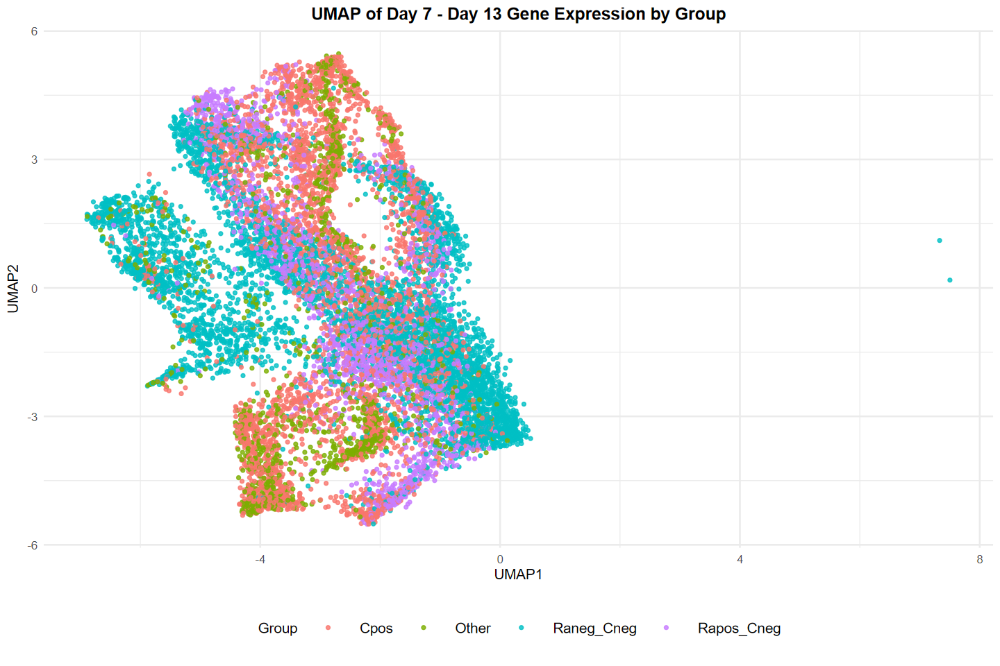

In [7]:
options(repr.plot.width = 12, repr.plot.height = 8)

umap_df <- reducedDim(merge2, "UMAP.cc") %>%
  as.data.frame() %>%
  mutate(Group = merge2$Group)


gg_umap <- ggplot(umap_df, aes(x = UMAP1, y = UMAP2, color = Group)) +
  geom_point(alpha = 0.8, size = 1) +
  labs(
    title = "UMAP of Day 7 - Day 13 Gene Expression by Group",
    x = "UMAP1",
    y = "UMAP2",
    color = "Group"
  ) +
  theme_minimal(base_size = 12) +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold"),
    legend.position = "bottom",
    legend.text = element_text(size = 12), # Increase legend text size
    legend.key.size = unit(1.5, "cm") # Increase legend color box size
  )

# Print the UMAP plot
print(gg_umap)


It appears that we have to outliers, with a value exceedin `UMAP1 = 4` on the x-axis. Lets get rid of these, and then continue with our analysis. 

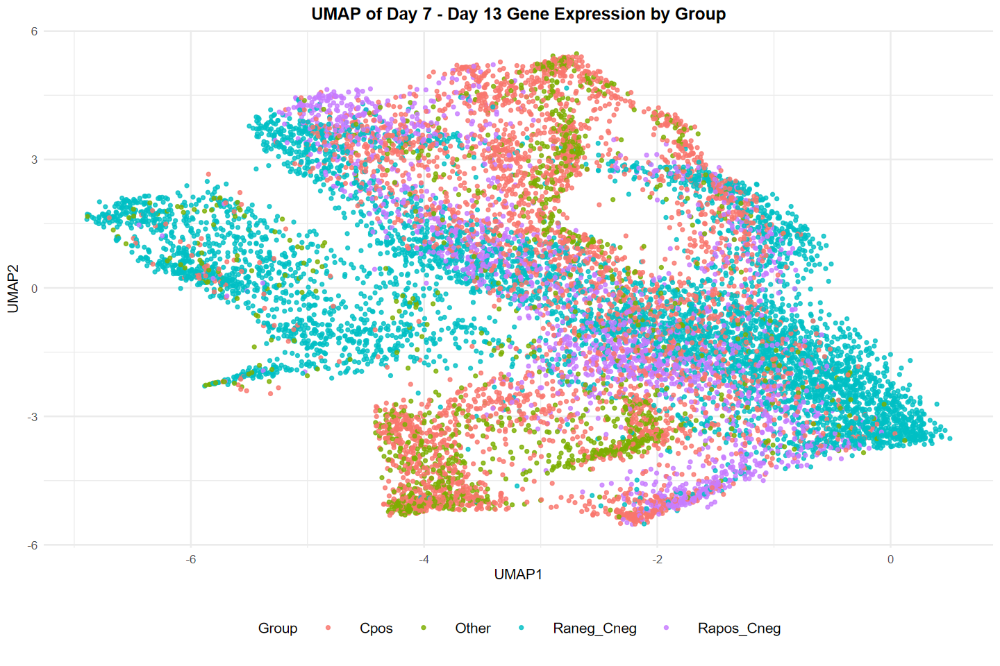

In [8]:
# Identify non-outlier cells
valid_cells <- which(reducedDim(merge2, "UMAP.cc")[, 1] < 4) # Filtering UMAP1 < 4

# Subset SingleCellExperiment object to keep only valid cells
merge2_clean <- merge2[, valid_cells]

# Confirming we get the sampe plot
umap_df <- reducedDim(merge2_clean, "UMAP.cc") %>%
  as.data.frame() %>%
  mutate(Group = merge2_clean$Group)


gg_umap <- ggplot(umap_df, aes(x = UMAP1, y = UMAP2, color = Group)) +
  geom_point(alpha = 0.8, size = 1) +
  labs(
    title = "UMAP of Day 7 - Day 13 Gene Expression by Group",
    x = "UMAP1",
    y = "UMAP2",
    color = "Group"
  ) +
  theme_minimal(base_size = 12) +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold"),
    legend.position = "bottom",
    legend.text = element_text(size = 12), # Increase legend text size
    legend.key.size = unit(1.5, "cm") # Increase legend color box size
  )
gg_umap


Next, lets add a column delineating which day each cell belongs to, so that we may analyze the differences in the three populations between each time point as well. 

In [9]:
# Extract the day information from cell names
colData(merge2_clean)$Day <- gsub(".*Day_([0-9]+).*", "\\1", rownames(colData(merge2_clean)))
# Convert to a factor (optional, for better categorical handling)
colData(merge2_clean)$Day <- factor(colData(merge2_clean)$Day, levels = sort(unique(colData(merge2_clean)$Day)))

colnames(colData(merge2_clean))


[1] "Sample"                            "Barcode"                          
 [3] "sum"                               "detected"                         
 [5] "subsets_Mito_sum"                  "subsets_Mito_detected"            
 [7] "subsets_Mito_percent"              "altexps_Antibody Capture_sum"     
 [9] "altexps_Antibody Capture_detected" "altexps_Antibody Capture_percent" 
[11] "total"                             "sizeFactor"                       
[13] "label"                             "scDblFinder.cluster"              
[15] "scDblFinder.class"                 "scDblFinder.score"                
[17] "scDblFinder.weighted"              "scDblFinder.difficulty"           
[19] "scDblFinder.cxds_score"            "scDblFinder.mostLikelyOrigin"     
[21] "scDblFinder.originAmbiguous"       "batch"                            
[23] "Phenotype"                         "Group"                            
[25] "Day"

## Analysis Workflow 

### RQ 1: Are There Unique Regions in Each of the 3 Populations of the GeneSpace? 

In this section, we will be looking at how the three populations are similiar, and how they are different, at a genespace level. The goal is to especially establish the changes in cell fate differences in the 3 populations. 

Lets begin by visualizing the 3 populations in the genespace, and look for qualitativie difference and similiarities in their population spread. 

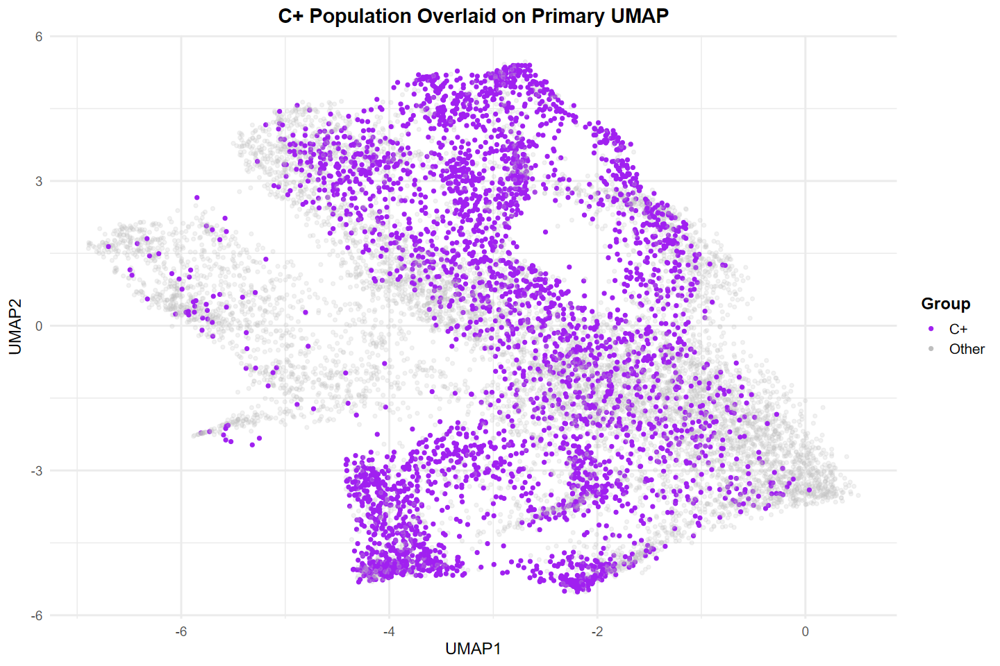

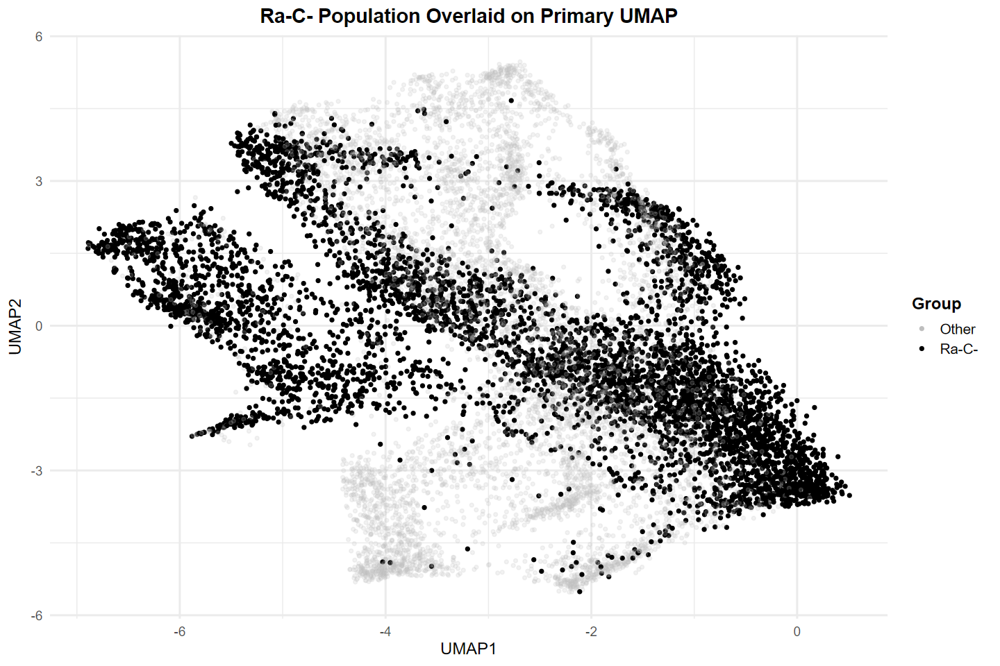

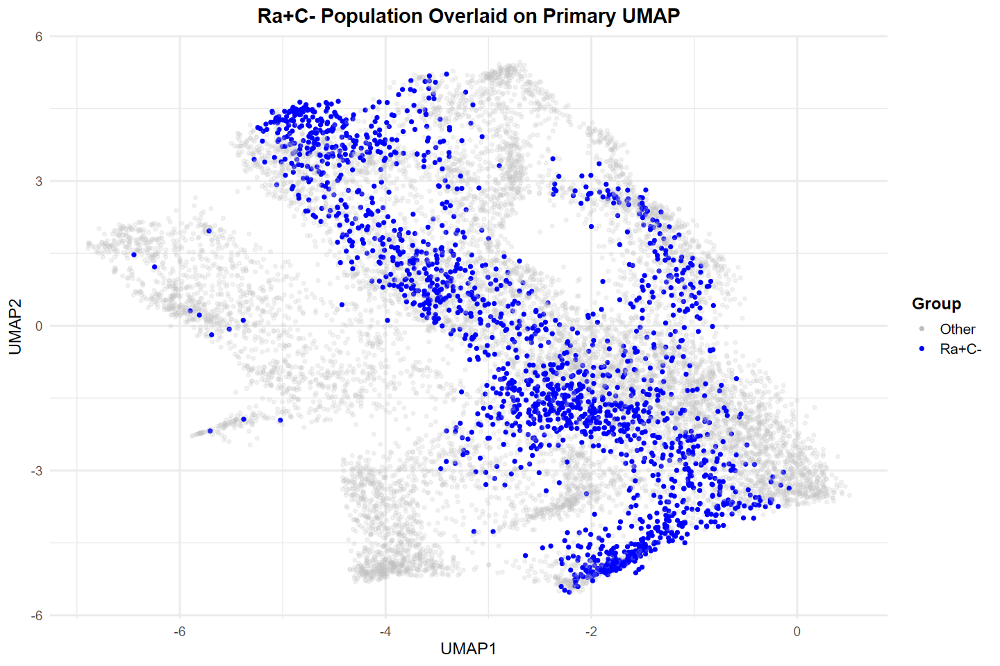

In [10]:
options(repr.plot.width = 12, repr.plot.height = 8)

gg_AllDay_AllPop <- gg_umap

gg_Cpos <- ggplot(umap_df, aes(x = UMAP1, y = UMAP2)) +
  geom_point(aes(color = ifelse(Group == "Cpos", "C+", "Other")),
    alpha = ifelse(umap_df$Group == "Cpos", 1, 0.2), size = 1
  ) +
  scale_color_manual(
    values = c("C+" = "purple", "Other" = "gray"),
    name = "Group"
  ) +
  labs(
    title = "C+ Population Overlaid on Primary UMAP",
    x = "UMAP1",
    y = "UMAP2"
  ) +
  theme_minimal(base_size = 14) +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold"),
    legend.position = "right",
    legend.text = element_text(size = 12),
    legend.title = element_text(size = 14, face = "bold")
  )

gg_RanegCneg <- ggplot(umap_df, aes(x = UMAP1, y = UMAP2)) +
  geom_point(aes(color = ifelse(Group == "Raneg_Cneg", "Ra-C-", "Other")),
    alpha = ifelse(umap_df$Group == "Raneg_Cneg", 1, 0.2), size = 1
  ) +
  scale_color_manual(
    values = c("Ra-C-" = "black", "Other" = "gray"),
    name = "Group"
  ) +
  labs(
    title = "Ra-C- Population Overlaid on Primary UMAP",
    x = "UMAP1",
    y = "UMAP2"
  ) +
  theme_minimal(base_size = 14) +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold"),
    legend.position = "right",
    legend.text = element_text(size = 12),
    legend.title = element_text(size = 14, face = "bold")
  ) #+
# scale_x_continuous(breaks = seq(-7, 1, by = 1)) + # More x-axis ticks
# scale_y_continuous(breaks = seq(-7, 6, by = 1)) # More y-axis ticks


gg_RaposCneg <- ggplot(umap_df, aes(x = UMAP1, y = UMAP2)) +
  geom_point(aes(color = ifelse(Group == "Rapos_Cneg", "Ra+C-", "Other")),
    alpha = ifelse(umap_df$Group == "Rapos_Cneg", 1, 0.2), size = 1
  ) +
  scale_color_manual(
    values = c("Ra+C-" = "blue", "Other" = "gray"),
    name = "Group"
  ) +
  labs(
    title = "Ra+C- Population Overlaid on Primary UMAP",
    x = "UMAP1",
    y = "UMAP2"
  ) +
  theme_minimal(base_size = 14) +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold"),
    legend.position = "right",
    legend.text = element_text(size = 12),
    legend.title = element_text(size = 14, face = "bold")
  )


# Print the UMAP plot
print(gg_Cpos)
print(gg_RanegCneg)
print(gg_RaposCneg)


Nice! Lets now create a faceted visualization, showing the distribution of the 3 populations overlaid in the same UMAP. 

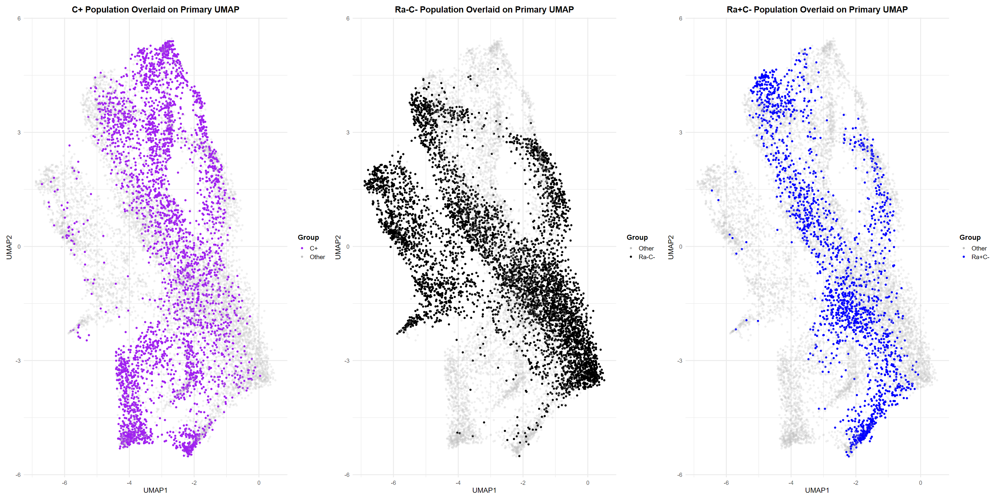

In [11]:
# Makes the plot nice and wide.
options(repr.plot.width = 28, repr.plot.height = 14)


# Combine two plots side by side
gg_combined <- gg_Cpos + gg_RanegCneg + gg_RaposCneg + plot_layout(ncol = 3)

# Print the combined plot
print(gg_combined)


Very interesting, what are some take-aways we can see from this distribution. Perhaps we can manually subset groups and complete DGE on them, to look for more pronounced differences between groups: 

1. All groups have some homogeneity along the diagonal, which is their primary region of overlap. 

2. At the bottom left, the island is primarily C+ cells. That area is dominated by the C+ cells, and nothing else. Hence, it appears to be a near homogenous C+ population that exists there, within this dataset. Similiarly, the peak at the top of the plot is also dominated by C+ cells, and could be another subset to look at when completing DGE. 

3. The larger island, on a diagonal from -4 to -7, seems to be primarily occuped by the Ra-C- population. Additionally, the bottom right peak also seems to be enriched for this population. 

4. The small long island at the bottom is very enriched for Ra+C- cells, but the lower half has some overlap with C+ population. Additionally, there is a small enrichment in the top left, which is unique to the population, but it is limited. 

Heres's the regions of interest highlighted with circles:  

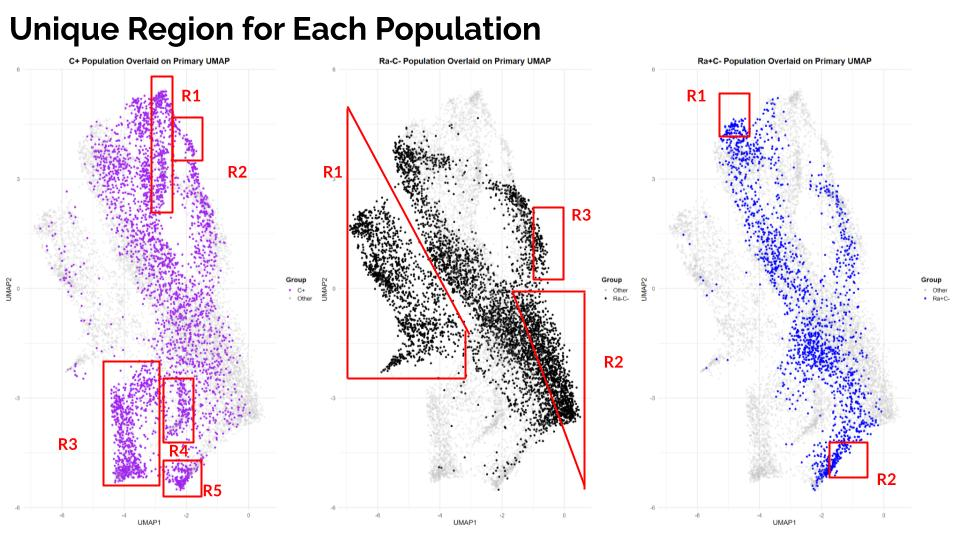

In [12]:
display_jpeg(file = "img/3Unique.jpg")


### RQ2 : What is the Genetic Makeup of Regions Unique to Each Population. Does it Have Functional Implications? 

Now that we have identified these unique regions, lets take a look at what genes are over-expressed in this locations, compared to the rest of the UMAP. This will give some hints into what is functionally  unique about these cells within each population - perhaps pointing to the existance of a subcluster/subpopulation with a linked fate.

To begin, we must modify our `Merg2` sce object to only contain cells that belong to these populations. Lets do that below: 

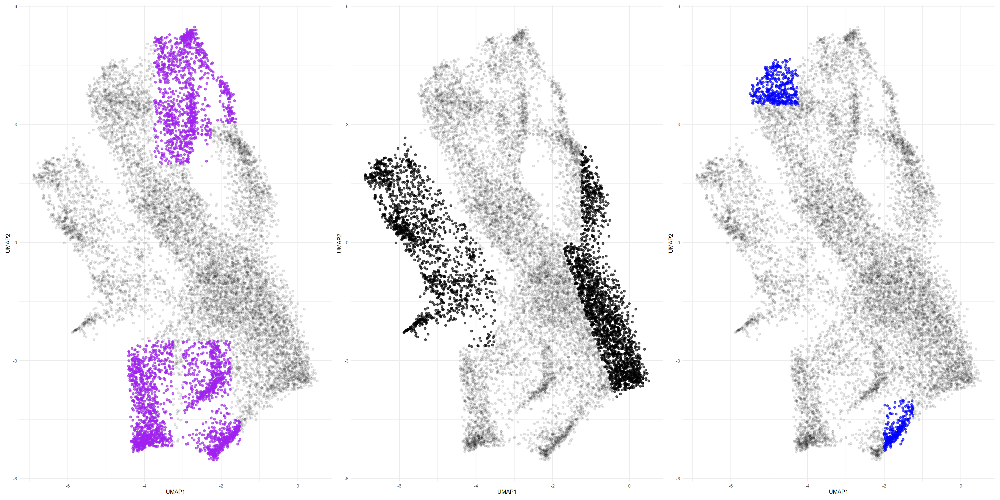

In [13]:
options(repr.plot.width = 12, repr.plot.height = 8)

## Segmenting Unique CPos Cells
CPos_R1_pooled <- rownames(subset(umap_df, UMAP1 > -3.75 & UMAP1 < -2.25 &
  UMAP2 > 2 & UMAP2 < 6)) # nolint Square region R1
CPos_R2_pooled <- rownames(subset(umap_df, UMAP1 > -2.5 & UMAP1 < -1.5 &
  UMAP2 > 3 & UMAP2 < 5)) # nolint Square region R2
CPos_R3_pooled <- rownames(subset(umap_df, UMAP1 > -4.5 & UMAP1 < -3.25 &
  UMAP2 > -5.5 & UMAP2 < -2.5)) # nolint Square region R3
CPos_R4_pooled <- rownames(subset(umap_df, UMAP1 < -1.75 & UMAP1 > -3 &
  -4.5 < UMAP2 & UMAP2 < -2.5)) # nolint Square region R4
CPos_R5_pooled <- rownames(subset(umap_df, UMAP1 > -3 & UMAP1 < -1.5 &
  -5.75 < UMAP2 & UMAP2 < -4.5)) # nolint Square region R5

# Combine all unique C+ Cells into one vector
Cpos_unique_pooled <- unique(c(
  CPos_R1_pooled, CPos_R2_pooled,
  CPos_R3_pooled, CPos_R4_pooled, CPos_R5_pooled
))

# Subset the SCE object to retain only cells in any of the selected squares
merge2_CPosUnique <- merge2_clean[, Cpos_unique_pooled]

# Visualizing the unique C+ cells
Cpos_subset_plot <- ggplot(umap_df, aes(x = UMAP1, y = UMAP2)) +
  geom_point(alpha = 0.1) + # Lightly plot all cells
  geom_point(data = umap_df[Cpos_unique_pooled, ], color = "purple", alpha = 0.6) + # Highlight selected cells
  theme_minimal()



## Segmenting Unique Ra-C- Cells
RanegCneg_R1_pooled <- rownames(subset(umap_df, UMAP1 > -7 & UMAP1 < -3.5 &
  UMAP2 > -2.65 & UMAP2 < (-1.5 * UMAP1 + (-6.0)))) # nolint Square region R1
RanegCneg_R2_pooled <- rownames(subset(
  umap_df,
  UMAP2 < 0 & UMAP2 > (-2.8 * UMAP1 + (-5.0))
)) # nolint Square region R2
RanegCneg_R3_pooled <- rownames(subset(umap_df, UMAP1 > -1.25 & UMAP1 < 0.5 &
  UMAP2 > 0 & UMAP2 < 3)) # nolint Square region R3

# Combine all unique Ra-C- Cells into one vector
RanegCneg_unique_pooled <- unique(c(
  RanegCneg_R1_pooled, RanegCneg_R2_pooled,
  RanegCneg_R3_pooled
))

# Subset the SCE object to retain only cells in any of the selected squares
merge2_RanegCnegUnique <- merge2_clean[, RanegCneg_unique_pooled]

# Visualizing the unique Ra-C- cells
Raneg_Cneg_subset_plot <- ggplot(umap_df, aes(x = UMAP1, y = UMAP2)) +
  geom_point(alpha = 0.1) + # Lightly plot all cells
  geom_point(data = umap_df[RanegCneg_unique_pooled, ], color = "black", alpha = 0.6) + # Highlight selected cells
  theme_minimal()



## Segmenting Unique Ra+C- Cells
RaposCneg_R1_pooled <- rownames(subset(umap_df, UMAP1 > -5.5 & UMAP1 < -4.25 &
  UMAP2 > 3.5 & UMAP2 < 5.5)) # nolint Square region R1
RaposCneg_R2_pooled <- rownames(subset(umap_df, UMAP1 > -2 & UMAP1 < -1.25 &
  UMAP2 > -5.5 & UMAP2 < -4)) # nolint Square region R1

# Combine all unique Ra+C- Cells into one vector
RaposCneg_unique_pooled <- unique(c(
  RaposCneg_R1_pooled, RaposCneg_R2_pooled
))

# Subset the SCE object to retain only cells in any of the selected squares
merge2_RaposCnegUnique <- merge2_clean[, RaposCneg_unique_pooled]

# Visualizing the unique Ra+C- cells
Rapos_Cneg_subset_plot <- ggplot(umap_df, aes(x = UMAP1, y = UMAP2)) +
  geom_point(alpha = 0.1) + # Lightly plot all cells
  geom_point(data = umap_df[RaposCneg_unique_pooled, ], color = "blue", alpha = 0.6) + # Highlight selected cells
  theme_minimal()


# Plotting 3 Subsets side by side
options(repr.plot.width = 28, repr.plot.height = 14)

# Combine two plots side by side
gg_uniquePops_combined <- Cpos_subset_plot + Raneg_Cneg_subset_plot + Rapos_Cneg_subset_plot + plot_layout(ncol = 3)

# Print the combined plot
print(gg_uniquePops_combined)


In [14]:
# Initialize the Region column with a default value of "None"
colData(merge2_clean)$Region <- "None"

# Combine all Regions cell names into a single vector
all_R1_cells <- unique(c(RaposCneg_R1_pooled, RanegCneg_R1_pooled, CPos_R1_pooled))
all_R2_cells <- unique(c(RaposCneg_R2_pooled, RanegCneg_R2_pooled, CPos_R2_pooled))
all_R3_cells <- unique(c(RanegCneg_R3_pooled, CPos_R3_pooled))
all_R4_cells <- unique(CPos_R4_pooled)
all_R5_cells <- unique(CPos_R5_pooled)


# Ensure that we're only using valid cell names
valid_R1_cells <- intersect(all_R1_cells, colnames(merge2_clean))
valid_R2_cells <- intersect(all_R2_cells, colnames(merge2_clean))
valid_R3_cells <- intersect(all_R3_cells, colnames(merge2_clean))
valid_R4_cells <- intersect(all_R4_cells, colnames(merge2_clean))
valid_R5_cells <- intersect(all_R5_cells, colnames(merge2_clean))


# Assign "R1" to all valid R1 cells in the Region column
colData(merge2_clean)$Region[colnames(merge2_clean) %in% valid_R1_cells] <- "R1"
colData(merge2_clean)$Region[colnames(merge2_clean) %in% valid_R2_cells] <- "R2"
colData(merge2_clean)$Region[colnames(merge2_clean) %in% valid_R3_cells] <- "R3"
colData(merge2_clean)$Region[colnames(merge2_clean) %in% valid_R4_cells] <- "R4"
colData(merge2_clean)$Region[colnames(merge2_clean) %in% valid_R5_cells] <- "R5"

# Verify the result
table(colData(merge2_clean)$Region)



None   R1   R2   R3   R4   R5 
5125 2882 1961 1316  511  384 

Additionally, we will repeatedly be comparing different regions and different populations against each other. Instead of writing the same script over and over again, I have defined the function `perform_dge` to do this work for me in one location, saving space in this notebook. 

Here is some documentation regarding this function: 

**Arugments**: The function has the capacity to take up to 5 arguments at maximum, and 3 arugments at minimum: 
- `sce_object`: An sce object (in this analysis, merge2_clean) containing the experimental CITE-Seq data. 
- `target_pop`: One of the populations you want to compare. 
- `target_region`: The region in the target population that you want to compare 
- `comp_pop`: *Optional* - the other population you want to compare to. 
- `comp_region`: *Optional* - theo ther population's region you want to compare to. 

__Note__: Only the first 3 arguments are necessary. If only these are passed, the function will compare the target region to the remaining cells within the target population. 

Finally, the function will return a list containing the **top genes** that are differentially expressed, and **top CD marker associated genes** that are differentially expresseed. 

As a reminder, here is a table containing all the populations and their regions of interest, as defined above: 


**Population** | **Regions** | **Description**|
---------------|-------------|------------------|
"Raneg_Cneg"| "R1" , "R2" , "R3"| CD45Ra-Clec12A- population 
"Rapos_Cneg"| "R1" , "R2" | CD45Ra+Clec12A- population
"Cpos" | "R1", "R2", "R3", "R4", "R5" | Clec12A+ population


In [15]:
perform_dge <- function(sce_object, target_pop, target_region, comp_pop = NULL, comp_region = NULL) {
  # Identify target cells
  target_cells <- colnames(sce_object)[colData(sce_object)$Group == target_pop]
  sce_target <- sce_object[, target_cells]

  # Identify cells within the target region
  target_region_cells <- colnames(sce_target)[colData(sce_target)$Region == target_region] # nolint

  # Determine comparison group
  if (!is.null(comp_pop) && !is.null(comp_region)) {
    comp_cells <- colnames(sce_object)[colData(sce_object)$Group == comp_pop]
    sce_comp <- sce_object[, comp_cells]
    comp_region_cells <- colnames(sce_comp)[colData(sce_comp)$Region == comp_region] # nolint
    comparison_cells <- c(target_region_cells, comp_region_cells)
    colData(sce_target)$ComparisonGroup <- ifelse(colnames(sce_target) %in% target_region_cells, # nolint
      target_region, "Other"
    )
  } else {
    colData(sce_target)$ComparisonGroup <- ifelse(colnames(sce_target) %in% target_region_cells, # nolint
      target_region, "Other"
    )
  }

  # Extract logcounts assay
  expr_matrix <- assay(sce_target, "logcounts")

  # Create a design matrix
  design <- model.matrix(~ 0 + colData(sce_target)$ComparisonGroup)
  colnames(design) <- levels(factor(colData(sce_target)$ComparisonGroup))

  # Fit the linear model
  fit <- lmFit(expr_matrix, design)

  # Define the contrast
  contrast <- makeContrasts(contrasts = paste0(target_region, "-Other"), levels = design) # nolint
  fit2 <- contrasts.fit(fit, contrast)
  fit2 <- eBayes(fit2)


  # Extract top genes
  top_genes <- topTable(fit2, coef = 1, number = Inf, ) %>% # since I am always only contrasting two things #nolint
    filter(P.Value < 0.05) %>% # Filter by p-value
    arrange(desc(abs(logFC))) # Sort by Log-Fold Change

  # Extract top CD genes
  cd_genes <- top_genes[grep("CD", top_genes$ID), ]
  excluded_patterns <- "CDK|CDC|PCD|LCD|CDR|NCD|CCD|TCD|OCD|3CD|DCD|KCD"
  cd_genes <- cd_genes[!grepl(excluded_patterns, cd_genes$ID), ]

  # Return the results as a list
  return(list(top_genes = as.data.frame(top_genes), top_cd_genes = as.data.frame(cd_genes)))
}


##### Characterizing Region 1 (R1) of the Ra+C- Population

In this section we will be answering the question `What makes the Ra+C- Region 1 (R1) cells different from the remaining Ra+C- cells? `. We shall do so by completing DGE, and then supplementing it with a manual scrape of the top genes, and a automatic `Gene Ontology` (GO) analaysis. Lets begin with the workflow below:  

In [16]:
raPosCneg_R1_comparison <-
    perform_dge(sce_object = merge2_clean, target_pop = "Raneg_Cneg", target_region = "R1")

# Print the top Genes differentially expressed in this region
head(raPosCneg_R1_comparison$top_genes, 20)

# Print the top Cluster Differentiating Genes differentially expressed in this region
head(raPosCneg_R1_comparison$top_cd_genes, 20)


Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.5 GiB"
Warning message:
"Zero sample variances detected, have been offset away from zero"


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,HBD,2.600558,0.9332628,60.29083,0.000000e+00,0.000000e+00,1381.5478
2,STXBP5,2.387527,1.9199339,69.60401,0.000000e+00,0.000000e+00,1722.4838
3,ITGA2B,2.281450,0.7618509,92.47893,0.000000e+00,0.000000e+00,2561.5289
4,LTBP1,2.165247,0.6594841,65.40463,0.000000e+00,0.000000e+00,1567.9860
5,GP1BB,2.099730,0.6598842,72.72827,0.000000e+00,0.000000e+00,1837.8255
6,RAP1B,1.979228,2.1936284,70.07873,0.000000e+00,0.000000e+00,1739.9956
7,ABCC4,1.925287,1.0928290,72.21383,0.000000e+00,0.000000e+00,1818.8220
8,SPINK2,-1.924872,1.7426931,-69.27794,0.000000e+00,0.000000e+00,1710.4599
9,PLCB1,-1.875570,1.8908794,-59.28000,0.000000e+00,0.000000e+00,1345.0226


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
33,CD74,-1.3886235,2.2728535,-44.70930,0.000000e+00,0.000000e+00,840.1121
95,CD99,-1.0149487,1.4580142,-43.25054,0.000000e+00,0.000000e+00,792.7357
99,CD84,0.9984581,0.4955969,53.73067,0.000000e+00,0.000000e+00,1147.2357
107,CD48,-0.9684666,0.8941089,-44.67238,0.000000e+00,0.000000e+00,838.9039
126,CD63,0.9135788,2.2570242,37.46660,1.289011e-273,2.759011e-271,613.0672
142,CD36,0.8744668,0.3246596,36.77724,9.774527e-265,1.873076e-262,592.6316
143,CD34,-0.8677303,1.3150180,-35.24866,2.094257e-245,3.376736e-243,548.1467
177,CD44,-0.8126885,1.2309836,-32.72168,1.334583e-214,1.732166e-212,477.2655
195,CD55,0.7716636,0.5686104,39.33549,3.607161e-298,9.105220e-296,669.5748


##### Characterizing Region 2 (R2) of the Ra+C- Population

In this section we will be answering the question `What makes the Ra+C- Region 2 (R2) cells different from the remaining Ra+C- cells? `. We shall do so by completing DGE, and then supplementing it with a manual scrape of the top genes, and a automatic `Gene Ontology` (GO) analaysis. Note that this is a repetition of the previous workflow: 

In [17]:
raPosCneg_R2_comparison <-
    perform_dge(sce_object = merge2_clean, target_pop = "Raneg_Cneg", target_region = "R2")

# Print the top Genes differentially expressed in this region
head(raPosCneg_R2_comparison$top_genes, 20)

# Print the top Cluster Differentiating Genes differentially expressed in this region
head(raPosCneg_R2_comparison$top_cd_genes, 20)


Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.5 GiB"
Warning message:
"Zero sample variances detected, have been offset away from zero"


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,NKAIN2,1.6173566,2.7157017,35.88455,2.191341e-253,2.673509e-249,566.5133
2,HIST1H4C,-1.3112881,2.2538890,-28.05665,6.383785e-162,3.894215e-159,356.0775
3,HMGB2,-1.2863952,2.6003865,-38.38509,1.345418e-285,2.462181e-281,640.6437
4,TOP2A,-1.1748550,1.2552635,-34.55373,8.701558e-237,3.981071e-233,528.3167
5,UBE2C,-1.1563485,0.9767416,-34.60196,2.213043e-237,1.157137e-233,529.6850
6,TUBB4B,-1.1293153,1.5703254,-35.09399,1.772643e-243,1.297610e-239,543.7134
7,HBD,-1.1049158,0.9332628,-20.55624,1.679011e-90,2.301628e-88,191.8769
8,HLA-DRA,1.0408271,2.3423770,26.37118,2.330121e-144,9.072847e-142,315.6858
9,MSI2,1.0300816,2.5742865,30.68656,6.450141e-191,1.026442e-187,422.7771


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
17,CD74,0.9527469,2.2728535,28.006355,2.192806e-161,1.294498e-158,354.84484
45,CD52,0.7753846,1.5512427,27.875007,5.459927e-160,3.122481e-157,351.63352
64,CD99,0.6737835,1.4580142,26.238619,5.168612e-143,1.950272e-140,312.59046
100,CD48,0.5969166,0.8941089,24.800467,9.422292e-129,2.715475e-126,279.79801
136,CD34,0.5490061,1.3150180,20.871016,3.923522e-93,5.544588e-91,197.92294
138,CD37,0.5443091,1.4375666,23.676609,4.705785e-118,1.118419e-115,255.20109
195,CD44,0.4687010,1.2309836,17.705505,2.986698e-68,2.739753e-66,140.77385
315,CD84,-0.4014853,0.4955969,-17.942543,5.442702e-70,5.201262e-68,144.76716
316,CD53,0.4005713,0.8918330,17.744817,1.542205e-68,1.432646e-66,141.43284


#### Characterizing Region 1 (R1) of the C+ Population

In this section we will be answering the question `What makes the C+ Region 1 (R1) cells different from the remaining C+ cells? `. We shall do so by completing DGE, and then supplementing it with a manual scrape of the top genes. Note that this is a repetition of the previous workflow: 

In [18]:
Cpos_R1_comparison <-
    perform_dge(sce_object = merge2_clean, target_pop = "Cpos", target_region = "R1")

# Print the top Genes differentially expressed in this region
head(Cpos_R1_comparison$top_genes, 20)

# Print the top Cluster Differentiating Genes differentially expressed in this region
head(Cpos_R1_comparison$top_cd_genes, 20)


Warning message:
"Zero sample variances detected, have been offset away from zero"


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,TOP2A,1.943276,1.3769076,45.74262,0.000000e+00,0.000000e+00,814.3644
2,HIST1H4C,1.925317,2.3573200,30.62303,2.306751e-183,1.918850e-180,405.4065
3,MKI67,1.817081,1.2989187,49.55594,0.000000e+00,0.000000e+00,926.0785
4,UBE2C,1.698571,0.9020936,46.68556,0.000000e+00,0.000000e+00,841.7910
5,HMGB2,1.661068,2.7763606,33.39165,2.178373e-213,2.847523e-210,474.4930
6,CENPF,1.462420,1.3749132,33.77545,1.161869e-217,1.575020e-214,484.3259
7,ASPM,1.425954,1.0068074,40.02830,1.822738e-290,8.339254e-287,651.8870
8,NUSAP1,1.408244,1.0801089,44.33975,0.000000e+00,0.000000e+00,773.8441
9,UBE2S,1.311736,1.3815108,34.03413,1.481856e-220,2.086054e-217,490.9864


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
287,CD34,-0.3903839,0.53207044,-12.983288,1.042245e-37,1.053790e-35,70.6924335
319,CD74,0.3669891,3.26015404,6.774873,1.447153e-11,3.894651e-10,11.0997499
495,CD52,-0.2986400,0.73682286,-8.457527,3.906943e-17,1.623133e-15,23.7144037
938,CDYL,0.2070244,1.07175479,6.374878,2.061648e-10,4.944847e-09,8.5001428
961,CD36,0.2044258,0.56109847,5.454332,5.244542e-08,9.282180e-07,3.1063561
1057,CD1D,0.1933482,0.35725796,7.229902,5.866953e-13,1.799969e-11,14.2443287
1135,CD2AP,0.1831994,1.01727529,5.433625,5.885873e-08,1.035218e-06,2.9945094
1168,CD37,-0.1793484,1.44754954,-5.119618,3.220804e-07,5.101603e-06,1.3498041
1189,CD84,0.1769242,0.39274125,7.846612,5.581901e-15,1.997098e-13,18.8226322


#### Characterizing Region 2 (R2) of the C+ Population

In this section we will be answering the question `What makes the C+ Region 2 (R2) cells different from the remaining C+ cells? `. We shall do so by completing DGE, and then supplementing it with a manual scrape of the top genes. Note that this is a repetition of the previous workflow: 

In [19]:
Cpos_R2_comparison <-
    perform_dge(sce_object = merge2_clean, target_pop = "Cpos", target_region = "R2")

# Print the top Genes differentially expressed in this region
head(Cpos_R2_comparison$top_genes, 20)

# Print the top Cluster Differentiating Genes differentially expressed in this region
head(Cpos_R2_comparison$top_cd_genes, 20)


Warning message:
"Zero sample variances detected, have been offset away from zero"


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,HIST1H4C,-1.2749375,2.3573200,-11.906050,4.331929e-32,8.750025e-28,58.269990
2,AFF3,-0.8891336,2.3235517,-9.048177,2.318076e-19,5.921326e-16,29.215236
3,HDAC9,-0.8515274,2.6566573,-10.257135,2.358134e-24,2.157752e-20,40.594449
4,HIST1H1B,-0.8467840,1.0095044,-11.897492,4.781304e-32,8.750025e-28,58.171945
5,MPO,-0.7439102,1.9990494,-5.437782,5.751320e-08,1.079508e-05,3.453652
6,HIST1H1D,-0.6271537,1.2377228,-9.333600,1.733501e-20,7.049763e-17,31.779463
7,RABGAP1L,-0.6140369,1.8144553,-9.360959,1.346667e-20,6.161169e-17,32.029248
8,RUNX2,-0.5982653,1.9477654,-6.855253,8.332255e-12,4.356698e-09,12.077480
9,BCL2,-0.5901856,1.9437992,-7.473339,9.747972e-14,8.108762e-11,16.444884


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
133,CD44,-0.28755418,1.66439588,-5.597538,2.335505e-08,5.058095e-06,4.32802737
151,CD52,0.27580557,0.73682286,5.015646,5.539139e-07,7.481108e-05,1.26319967
190,CD63,0.25708566,1.89852791,4.735291,2.271162e-06,2.490101e-04,-0.09512028
195,CD38,-0.25596597,1.04718520,-4.828010,1.436003e-06,1.684588e-04,0.34556992
206,CD34,0.25273801,0.53207044,5.330375,1.039926e-07,1.829919e-05,2.87979671
230,CD99,0.23948973,1.17319929,5.063733,4.316057e-07,6.122946e-05,1.50392221
336,CDYL,-0.21229202,1.07175479,-4.211074,2.603367e-05,1.745162e-03,-2.42775880
512,CD59,0.17919633,0.45740367,5.222297,1.866608e-07,3.009680e-05,2.31373576
652,CD81,0.16235847,1.13598289,3.510907,4.520228e-04,1.603148e-02,-5.12067109


#### Characterizing Region 3 (R3) of the C+ Population

In this section we will be answering the question `What makes the C+ Region 2 (R2) cells different from the remaining C+ cells? `. We shall do so by completing DGE, and then supplementing it with a manual scrape of the top genes. Note that this is a repetition of the previous workflow: 

In [20]:
Cpos_R3_comparison <-
    perform_dge(sce_object = merge2_clean, target_pop = "Cpos", target_region = "R3")

# Print the top Genes differentially expressed in this region
head(Cpos_R3_comparison$top_genes, 20)

# Print the top Cluster Differentiating Genes differentially expressed in this region
head(Cpos_R3_comparison$top_cd_genes, 20)


Warning message:
"Zero sample variances detected, have been offset away from zero"


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,CST3,2.844294,2.1637611,39.57353,5.421427e-285,9.921483e-281,639.3532
2,S100A6,2.082420,1.6373426,38.37640,1.051391e-270,1.282732e-266,606.4672
3,S100A10,2.045921,1.0808110,38.29754,9.047193e-270,8.278407e-266,604.3157
4,LYZ,2.007371,1.5582085,26.15018,3.107731e-138,2.146152e-135,301.6571
5,SAMHD1,1.901196,2.0192066,28.80481,1.773546e-164,1.803154e-161,362.0221
6,S100A4,1.889538,3.3488066,36.22702,1.572152e-245,8.220334e-242,548.5259
7,HLA-DRA,1.708710,3.2477191,30.21503,4.584386e-179,6.453581e-176,395.5820
8,VIM,1.691064,3.3620246,31.65851,2.013729e-194,3.879185e-191,430.9163
9,HLA-DPA1,1.674286,2.1864050,32.17635,4.959687e-200,1.008497e-196,443.8214


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
17,CD74,1.4673176,3.26015404,27.785018,3.352864e-154,2.921861e-151,338.38232
39,CD1C,1.1770754,0.47744823,29.475448,2.316241e-171,2.568992e-168,377.85896
58,CD36,0.9897158,0.56109847,27.015999,1.306573e-146,1.062708e-143,320.92243
106,CD48,0.8113073,1.29148444,23.129594,1.627070e-110,7.352146e-108,237.91910
111,CD86,0.7988978,0.41886951,29.480308,2.063198e-171,2.359847e-168,377.97455
159,CD1D,0.6891653,0.35725796,26.143265,3.619463e-138,2.453259e-135,301.50488
278,CD37,0.5373237,1.44754954,14.747038,7.626808e-48,6.583698e-46,93.98203
309,CD34,-0.5176654,0.53207044,-16.343751,5.449568e-58,6.312014e-56,117.25487
323,CD4,0.5098941,0.28359894,20.678192,6.938321e-90,1.853646e-87,190.50256


#### Characterizing Region 4 (R4) of the C+ Population

In this section we will be answering the question `What makes the C+ Region 4 (R4) cells different from the remaining C+ cells? `. We shall do so by completing DGE, and then supplementing it with a manual scrape of the top genes. Note that this is a repetition of the previous workflow: 

In [21]:
Cpos_R4_comparison <-
    perform_dge(sce_object = merge2_clean, target_pop = "Cpos", target_region = "R4")

# Print the top Genes differentially expressed in this region
head(Cpos_R4_comparison$top_genes, 20)

# Print the top Cluster Differentiating Genes differentially expressed in this region
head(Cpos_R4_comparison$top_cd_genes, 20)

# print it as csv


Warning message:
"Zero sample variances detected, have been offset away from zero"


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,MPO,2.8475984,1.9990494,19.302327,4.221984e-79,1.716987e-75,166.21781
2,PRTN3,2.3095339,0.4257153,26.606883,1.250049e-142,2.287651e-138,312.25834
3,AZU1,1.7662224,0.2779040,30.812220,2.281937e-185,8.352117e-181,410.57526
4,LRMDA,1.5977458,2.2763890,16.870219,1.567365e-61,3.824475e-58,125.87388
5,FNDC3B,1.3983028,1.2114140,19.801434,6.052030e-83,3.164433e-79,175.04751
6,SERPINB1,1.3156648,1.9682292,16.123110,1.555673e-56,3.163289e-53,114.40711
7,CST3,-1.2797978,2.1637611,-9.201877,5.790519e-20,7.623697e-18,30.70691
8,HIST1H4C,-1.2525414,2.3573200,-10.322318,1.221591e-24,2.470246e-22,41.36658
9,LYST,1.1831815,1.1446418,16.114164,1.780624e-56,3.430138e-53,114.27253


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
63,CD74,-0.7150619,3.2601540,-7.575058,4.529492e-14,3.475554e-12,17.3189563
277,CD52,-0.4388130,0.7368229,-7.099802,1.496502e-12,9.694419e-11,13.8819585
311,CD164,-0.4225014,1.4962513,-7.157294,9.913394e-13,6.609110e-11,14.2862342
339,CD1C,-0.4094522,0.4774482,-5.654342,1.685336e-08,6.432221e-07,4.7652160
357,CD36,-0.4036869,0.5610985,-6.178264,7.198422e-10,3.322440e-08,7.8360348
397,CD53,-0.3805762,1.2940433,-6.286188,3.640248e-10,1.767065e-08,8.5016877
564,CD44,0.3305364,1.6643959,5.705780,1.250929e-08,4.844003e-07,5.0548880
672,CD84,0.3025318,0.3927413,7.684825,1.959387e-14,1.579637e-12,18.1434574
678,CD38,0.3009633,1.0471852,5.034617,5.021197e-07,1.451665e-05,1.4781942


#### Characterizing Region 5 (R5) of the C+ Population

In this section we will be answering the question `What makes the C+ Region 5 (R5) cells different from the remaining C+ cells? `. We shall do so by completing DGE, and then supplementing it with a manual scrape of the top genes. Note that this is a repetition of the previous workflow: 

In [22]:
Cpos_R5_comparison <-
    perform_dge(sce_object = merge2_clean, target_pop = "Cpos", target_region = "R5")

# Print the top Genes differentially expressed in this region
head(Cpos_R5_comparison$top_genes, 20)

# Print the top Cluster Differentiating Genes differentially expressed in this region
head(Cpos_R5_comparison$top_cd_genes, 20)


Warning message:
"Zero sample variances detected, have been offset away from zero"


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,LTB,3.106609,1.2740898,28.62571,1.176798e-162,1.305211e-159,358.3944
2,TUBA1B,-2.921061,3.9090800,-36.86598,6.033597e-253,3.154796e-249,566.1566
3,TCF4,2.816225,1.7692575,25.91093,5.949752e-136,4.032720e-133,296.9723
4,JCHAIN,2.804626,0.4055437,44.25181,0.000000e+00,0.000000e+00,771.9434
5,H2AFZ,-2.686776,3.7948555,-34.87649,4.659122e-230,1.894762e-226,513.4821
6,LINC01478,2.435756,0.2620662,42.21482,4.191758e-317,7.671126e-313,713.8319
7,HMGB2,-2.414741,2.7763606,-24.42964,3.783900e-122,2.036684e-119,265.2299
8,CCDC50,2.359768,1.1358201,27.21492,1.465646e-148,1.277240e-145,325.9713
9,CUX2,2.315946,0.4353410,39.75071,4.023346e-287,3.681462e-283,644.8176


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
62,CD74,1.4602567,3.2601540,14.705108,1.369381e-47,1.369418e-45,93.963105
164,CD2AP,1.0363949,1.0172753,16.961146,3.749002e-62,6.323375e-60,127.371493
228,CD164,0.9516593,1.4962513,15.378149,9.554399e-52,1.128066e-49,103.494256
281,CD37,0.8932082,1.4475495,13.904418,7.371545e-43,6.131952e-41,83.118993
351,CD63,-0.8293675,1.8985279,-12.850532,5.421698e-37,3.562649e-35,69.681283
359,CDYL,0.8201088,1.0717548,13.735999,6.804267e-42,5.497637e-40,80.907333
439,CD53,0.7633746,1.2940433,11.897958,4.755664e-32,2.497304e-30,58.369259
556,HACD3,-0.6845285,0.9205431,-12.665119,5.287620e-36,3.331018e-34,67.416855
731,CD81,-0.5988106,1.1359829,-10.839106,5.796802e-27,2.326412e-25,46.743790


#### Characterizing Region 1 (R1) of the Ra-C- Population

In this section we will be answering the question `What makes the Ra-C- Region 1 (R1) cells different from the remaining Ra-C- cells? `. We shall do so by completing DGE, and then supplementing it with a manual scrape of the top genes. Note that this is a repetition of the previous workflow: 

In [23]:
Raneg_Cneg_R1_comparison <-
    perform_dge(sce_object = merge2_clean, target_pop = "Raneg_Cneg", target_region = "R1")

# Print the top Genes differentially expressed in this region
head(Raneg_Cneg_R1_comparison$top_genes, 20)

# Print the top Cluster Differentiating Genes differentially expressed in this region
head(Raneg_Cneg_R1_comparison$top_cd_genes, 20)

write.csv(Raneg_Cneg_R1_comparison$top_genes, "topGenes_Region1.csv")
write.csv(Raneg_Cneg_R1_comparison$top_cd_genes, "topCD_Region1.csv")


Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.5 GiB"
Warning message:
"Zero sample variances detected, have been offset away from zero"


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,HBD,2.600558,0.9332628,60.29083,0.000000e+00,0.000000e+00,1381.5478
2,STXBP5,2.387527,1.9199339,69.60401,0.000000e+00,0.000000e+00,1722.4838
3,ITGA2B,2.281450,0.7618509,92.47893,0.000000e+00,0.000000e+00,2561.5289
4,LTBP1,2.165247,0.6594841,65.40463,0.000000e+00,0.000000e+00,1567.9860
5,GP1BB,2.099730,0.6598842,72.72827,0.000000e+00,0.000000e+00,1837.8255
6,RAP1B,1.979228,2.1936284,70.07873,0.000000e+00,0.000000e+00,1739.9956
7,ABCC4,1.925287,1.0928290,72.21383,0.000000e+00,0.000000e+00,1818.8220
8,SPINK2,-1.924872,1.7426931,-69.27794,0.000000e+00,0.000000e+00,1710.4599
9,PLCB1,-1.875570,1.8908794,-59.28000,0.000000e+00,0.000000e+00,1345.0226


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
33,CD74,-1.3886235,2.2728535,-44.70930,0.000000e+00,0.000000e+00,840.1121
95,CD99,-1.0149487,1.4580142,-43.25054,0.000000e+00,0.000000e+00,792.7357
99,CD84,0.9984581,0.4955969,53.73067,0.000000e+00,0.000000e+00,1147.2357
107,CD48,-0.9684666,0.8941089,-44.67238,0.000000e+00,0.000000e+00,838.9039
126,CD63,0.9135788,2.2570242,37.46660,1.289011e-273,2.759011e-271,613.0672
142,CD36,0.8744668,0.3246596,36.77724,9.774527e-265,1.873076e-262,592.6316
143,CD34,-0.8677303,1.3150180,-35.24866,2.094257e-245,3.376736e-243,548.1467
177,CD44,-0.8126885,1.2309836,-32.72168,1.334583e-214,1.732166e-212,477.2655
195,CD55,0.7716636,0.5686104,39.33549,3.607161e-298,9.105220e-296,669.5748


#### Characterizing Region 2 (R2) of the Ra-C- Population

In this section we will be answering the question `What makes the Ra-C- Region 2 (R2) cells different from the remaining Ra-C- cells? `. We shall do so by completing DGE, and then supplementing it with a manual scrape of the top genes. Note that this is a repetition of the previous workflow: 

In [24]:
Raneg_Cneg_R2_comparison <-
    perform_dge(sce_object = merge2_clean, target_pop = "Raneg_Cneg", target_region = "R2")

# Print the top Genes differentially expressed in this region
head(Raneg_Cneg_R2_comparison$top_genes, 20)

# Print the top Cluster Differentiating Genes differentially expressed in this region
head(Raneg_Cneg_R2_comparison$top_cd_genes, 20)


Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.5 GiB"
Warning message:
"Zero sample variances detected, have been offset away from zero"


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,NKAIN2,1.6173566,2.7157017,35.88455,2.191341e-253,2.673509e-249,566.5133
2,HIST1H4C,-1.3112881,2.2538890,-28.05665,6.383785e-162,3.894215e-159,356.0775
3,HMGB2,-1.2863952,2.6003865,-38.38509,1.345418e-285,2.462181e-281,640.6437
4,TOP2A,-1.1748550,1.2552635,-34.55373,8.701558e-237,3.981071e-233,528.3167
5,UBE2C,-1.1563485,0.9767416,-34.60196,2.213043e-237,1.157137e-233,529.6850
6,TUBB4B,-1.1293153,1.5703254,-35.09399,1.772643e-243,1.297610e-239,543.7134
7,HBD,-1.1049158,0.9332628,-20.55624,1.679011e-90,2.301628e-88,191.8769
8,HLA-DRA,1.0408271,2.3423770,26.37118,2.330121e-144,9.072847e-142,315.6858
9,MSI2,1.0300816,2.5742865,30.68656,6.450141e-191,1.026442e-187,422.7771


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
17,CD74,0.9527469,2.2728535,28.006355,2.192806e-161,1.294498e-158,354.84484
45,CD52,0.7753846,1.5512427,27.875007,5.459927e-160,3.122481e-157,351.63352
64,CD99,0.6737835,1.4580142,26.238619,5.168612e-143,1.950272e-140,312.59046
100,CD48,0.5969166,0.8941089,24.800467,9.422292e-129,2.715475e-126,279.79801
136,CD34,0.5490061,1.3150180,20.871016,3.923522e-93,5.544588e-91,197.92294
138,CD37,0.5443091,1.4375666,23.676609,4.705785e-118,1.118419e-115,255.20109
195,CD44,0.4687010,1.2309836,17.705505,2.986698e-68,2.739753e-66,140.77385
315,CD84,-0.4014853,0.4955969,-17.942543,5.442702e-70,5.201262e-68,144.76716
316,CD53,0.4005713,0.8918330,17.744817,1.542205e-68,1.432646e-66,141.43284


#### Characterizing Region 1 (R3) of the Ra-C- Population

In this section we will be answering the question `What makes the Ra-C- Region 3 (R3) cells different from the remaining Ra-C- cells? `. We shall do so by completing DGE, and then supplementing it with a manual scrape of the top genes. Note that this is a repetition of the previous workflow: 

In [25]:
Raneg_Cneg_R3_comparison <-
    perform_dge(sce_object = merge2_clean, target_pop = "Raneg_Cneg", target_region = "R3")

# Print the top Genes differentially expressed in this region
head(Raneg_Cneg_R3_comparison$top_genes, 20)

# Print the top Cluster Differentiating Genes differentially expressed in this region
head(Raneg_Cneg_R3_comparison$top_cd_genes, 20)


Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.5 GiB"
Warning message:
"Zero sample variances detected, have been offset away from zero"


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,FHIT,-1.4255407,1.9786639,-19.698355,1.670403e-83,3.056922e-79,176.56335
2,WWOX,-1.3788230,2.2088429,-18.252876,2.677836e-72,1.960230e-68,150.82943
3,NKAIN2,-1.3215391,2.7157017,-12.467633,3.368158e-35,4.109265e-32,65.75139
4,RAD51B,-1.3124129,1.8692422,-21.187735,8.163596e-96,2.987958e-91,204.84806
5,IMMP2L,-1.2600372,1.9230808,-19.037507,2.739828e-78,2.507012e-74,164.58520
6,LRMDA,-1.1954152,2.1615629,-17.548987,4.097231e-67,2.499379e-63,138.92597
7,SMYD3,-1.1305355,2.3841554,-19.496263,6.822155e-82,8.323256e-78,172.86257
8,MALAT1,-1.0991620,5.8601224,-17.163512,2.372408e-64,9.648056e-61,132.58439
9,STXBP5,-1.0934012,1.9199339,-10.908477,2.011331e-27,1.840419e-24,47.97152


,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
126,CDV3,0.4613797,1.2229999,9.938467,4.442713e-23,2.665701e-20,38.0565977
247,CD84,-0.3533260,0.4955969,-7.186041,7.565594e-13,1.085915e-10,14.8056108
348,CD164,0.3068021,1.8707070,5.665244,1.543257e-08,9.336323e-07,5.1061422
405,CD36,-0.2896939,0.3246596,-5.085077,3.797517e-07,1.676634e-05,2.0035589
421,CD82,-0.2824216,0.5675827,-6.556442,6.018063e-11,5.985519e-09,10.5158853
508,CD63,-0.2598229,2.2570242,-4.428176,9.688833e-06,2.674366e-04,-1.1086749
513,CD74,0.2591115,2.2728535,3.323134,8.959829e-04,1.289562e-02,-5.3802127
571,CD48,0.2480557,0.8941089,4.562841,5.157164e-06,1.517342e-04,-0.5054093
577,HACD3,0.2477402,1.1536948,5.238582,1.678891e-07,8.128185e-06,2.7922191


Since it would get very unwieldy if I was to characterize and interpret these populations here, I have done so in an external slide deck, which can be found using this link: 

https://docs.google.com/presentation/d/1Jd8VXRSZ-4r_1EfP6tuxpk56tDw5Yt-8lMsy-ucJkSI/edit?usp=sharing

However, I did relabel the populations according to their subsets. Here's the final result: 